In [40]:
%matplotlib notebook

In [41]:
import numpy as np
import matplotlib.pyplot as plt
import celerite
from celerite import terms
import emcee
import corner
from scipy import signal
from scipy import stats
from scipy.optimize import minimize
from scipy.optimize import curve_fit
from IPython.display import display, Math, Image
import os
from astropy.io import fits
import pandas as pd
import glob
from astropy.io import ascii
from astropy.timeseries import LombScargle

In [42]:
dir = os.getcwd()
dir

'C:\\Users\\Marc\\Documents\\repo\\stage_m2\\src'

In [43]:
par_dir = os.path.dirname(dir)
par_dir

'C:\\Users\\Marc\\Documents\\repo\\stage_m2'

In [44]:
rv_data = pd.read_csv(par_dir + "/data/Posteriors_RV.csv").ffill().set_index(['Photometry','Sector','RV group'])
rv_data_norm = pd.read_csv(par_dir + "/data/Posteriors_RV_TESS_norm.csv").ffill().set_index(['Photometry','Sector','RV group'])
columns = {"Inc - S0" : "Inc - Log S0","Inc + S0" : "Inc + Log S0","Inc - Q" : "Inc - Log Q","Inc + Q" : "Inc + Log Q","Inc - w0":"Inc - Log w0","Inc + w0" : "Inc + Log w0"}
rv_data = rv_data.rename(columns=columns)

sectors_names = {"TESS_18_19" : ["All","Sector1","Sector2","Sector3"],
                "TESS_20_0" : ["All","Sector1","Sector2"],
                "TESS_20_1" : ["All","Sector1","Sector2"],
                "TESS_21" : ["All","Sector1","Sector2"]}

rv_times = rv_data.loc[("TESS_18_19","All")].index.values

hps = ["Log S0","Log Q","Log w0","Offset"]
rv_data

Likelihood    Log S0     Log Q    Log w0  \
Photometry Sector  RV group                                              
TESS_18_19 All     544.40    -971.649529  2.547590  2.947536  5.730163   
                   780.71    -196.814918  1.335806  4.553424  5.671059   
                   799.71    -371.637423  2.386932  4.196058  5.572647   
                   829.66    -439.008167  3.020324  3.376745  5.689225   
                   851.32    -770.644290  3.508715  2.555723  5.630536   
...                                  ...       ...       ...       ...   
TESS_21    Sector2 4525.58  -1054.428065  3.337437  3.263083  5.702798   
                   4787.42  -1303.271697  3.871064  2.327084  5.712431   
                   4828.73  -4179.157470  3.112919  2.428803  5.727458   
                   4907.33  -1806.301728  2.763967  3.215796  5.704781   
                   4922.58  -3141.613718  2.751620  2.994132  5.767353   

                                 Offset  Inc - Log S0  Inc + Log S0  \
Photometry Sector  RV group                                           
TESS_18_19 All     544.40    -79.391760      0.331806      0.349500   
                   780.71    -62.424012      1.082434      0.970303   
                   799.71    -68.114706      0.548858      0.571108   
                   829.66   -200.397371      0.437210      0.477533   
                   851.32   -133.347035      0.328004      0.361503   
...                                 ...           ...           ...   
TESS_21    Sector2 4525.58   -93.073503      0.291879      0.322322   
                   4787.42     4.145611      0.220565      0.236908   
                   4828.73    29.448901      0.130732      0.137736   
                   4907.33    51.980707      0.243508      0.262387   
                   4922.58    64.073118      0.165741      0.173617   

                             Inc - Log Q  Inc + Log Q  Inc - Log w0  \
Photometry Sector  RV group                                           
TESS_18_19 All     544.40       0.533074     0.619874      0.026718   
                   780.71       1.394292     1.765093      0.033030   
                   799.71       1.075518     1.413274      0.034246   
                   829.66       0.824807     1.242755      0.025751   
                   851.32       0.625415     0.808642      0.041401   
...                                  ...          ...           ...   
TESS_21    Sector2 4525.58      0.787640     1.226574      0.028769   
                   4787.42      0.398824     0.490827      0.023188   
                   4828.73      0.287588     0.362765      0.014627   
                   4907.33      0.477471     0.558010      0.018880   
                   4922.58      0.391325     0.509856      0.014275   

                             Inc + Log w0  Inc - Offset  Inc + Offset  
Photometry Sector  RV group                                            
TESS_18_19 All     544.40        0.026572     14.665954     15.073758  
                   780.71        0.027976     18.320395     17.585461  
                   799.71        0.033674     18.112660     18.684302  
                   829.66        0.025026     24.932107     25.015267  
                   851.32        0.038640     22.660095     23.140704  
...                                   ...           ...           ...  
TESS_21    Sector2 4525.58       0.027831     20.906861     20.851623  
                   4787.42       0.023007     17.043797     17.173657  
                   4828.73       0.014435      8.157650      8.065910  
                   4907.33       0.018849     12.763950     12.461801  
                   4922.58       0.014121      8.805081      8.825232  

[429 rows x 13 columns]

In [6]:
x = [i for i in range(13)]
myxticks = np.array([])
for photometry in sectors_names.keys() :
            for name in sectors_names[photometry] :
                myxticks = np.append(myxticks,photometry + "_" + name)

for hp in hps :
    for t in rv_times :
        stock = np.array([])
        plt.figure()
        for photometry in sectors_names.keys() :
            for name in sectors_names[photometry] :
                stock = np.append(stock,rv_data.loc[(photometry,name,t),(hp,"Inc - " + hp,"Inc + " + hp)].values)
        stock = np.reshape(stock,(13,3))
        plt.grid()
        plt.xticks(x,myxticks,rotation=90)
        plt.errorbar(x,stock[:,0],yerr=stock[:,1:3].T,markersize=5,capsize=3,fmt='o')
        plt.ylabel(hp)
        plt.title("%s_%s"%(hp,t))
        plt.savefig(par_dir + "/plots/Comparison/RV_HP/%s_%s.png"%(hp,t),bbox_inches='tight')
        plt.close()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [39]:
file_offsets_data = np.loadtxt(par_dir + "/data/RV_offsets_TESS_ALL.txt",skiprows=1)
rv_vandal = np.loadtxt(par_dir + "/data/rv_vandal_data.txt",usecols=(1,2),skiprows=8)
rv_lagrange_2019_m2 = np.loadtxt(par_dir + "/data/rv_lagrange_2019_m2_data.txt",usecols=(1,2))
rv_lagrange_2019_m5 = np.loadtxt(par_dir + "/data/rv_lagrange_2019_m5_data.txt",usecols=(1,2))
rv_lagrange_2020 = np.loadtxt(par_dir + "/data/rv_lagrange_2020_data.txt",usecols=(1,2))
index_delete = [5,17,19,21]
rv_lagrange_2019_m5_offsets = np.delete(rv_lagrange_2019_m5[:,0],index_delete) *1000
rv_lagrange_2019_m5_offsets_errors = np.delete(rv_lagrange_2019_m5[:,1],index_delete) *1000
# print("vandal : ",rv_vandal.shape,"\nlag2019m2 : ",rv_lagrange_2019_m2.shape,"\nlag2019m5 : ",rv_lagrange_2019_m5_offsets.shape,"\nlag2020 : ",rv_lagrange_2020.shape,"\nGP : ",rv_GP.shape)

# print("vandal : ",rv_vandal.mean(),"\nlag2019m2 : ",rv_lagrange_2019_m2.mean(),"\nlag2019m5 : ",rv_lagrange_2019_m5_offsets.mean(),"\nlag2020 : ",rv_lagrange_2020.mean(),"\nGP : ",rv_GP.mean())
file = open(par_dir + "/data/test_tab.txt","w")
for i in range(28) :
    file.write("%.2f & %.2f $^{+ %.2f}_{- %.2f}$ & %s $\pm$ %s & %.3f $\pm$ %.3f & %s $\pm$ %s & %s $\pm$ %s\\\ \n"
              %(file_offsets_data[i,0],file_offsets_data[i,1],file_offsets_data[i,2],file_offsets_data[i,3],rv_lagrange_2019_m2[i,0],rv_lagrange_2019_m2[i,1],rv_lagrange_2019_m5_offsets[i],rv_lagrange_2019_m5_offsets_errors[i],rv_lagrange_2020[i,0],rv_lagrange_2020[i,1],rv_vandal[i,0],rv_vandal[i,1]))
for i in range(28,31) :
    file.write("%.2f & %.2f $^{+ %.2f}_{- %.2f}$ & / & %.3f $\pm$ %.3f & %s $\pm$ %s & / \\\ \n"
              %(file_offsets_data[i,0],file_offsets_data[i,1],file_offsets_data[i,2],file_offsets_data[i,3],rv_lagrange_2019_m5_offsets[i],rv_lagrange_2019_m5_offsets_errors[i],rv_lagrange_2020[i,0],rv_lagrange_2020[i,1]))
for i in range(31,len(file_offsets_data)) :
    file.write("%.2f & %.2f $^{+ %.2f}_{- %.2f}$ & / & / & %s $\pm$ %s & / \\\ \n"
              %(file_offsets_data[i,0],file_offsets_data[i,1],file_offsets_data[i,2],file_offsets_data[i,3],rv_lagrange_2020[i,0],rv_lagrange_2020[i,1]))
file.close()


<IPython.core.display.Javascript object>


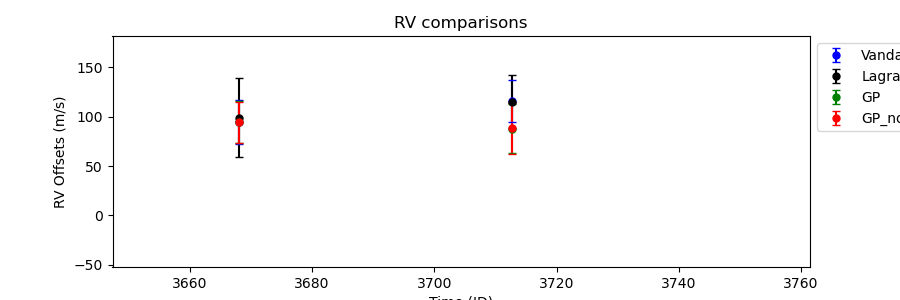

In [9]:
plt.figure(figsize=(9,3))
plt.errorbar(rv_times[0:28], rv_vandal[:,0] - np.mean(rv_vandal[:,0]), yerr = rv_vandal[:,1], fmt = 'ob', markersize = 5, capsize = 3, label = "Vandal")
# plt.errorbar(rv_times[0:28], rv_lagrange_2019_m2[:,0] - np.mean(rv_lagrange_2019_m2[:,0]), yerr = rv_lagrange_2019_m2[:,1], fmt = 'or', markersize = 5, capsize = 3, label = "Lagrange_2019_M2")
# plt.errorbar(rv_times[0:31], rv_lagrange_2019_m5_offsets - np.mean(rv_lagrange_2019_m5_offsets), yerr = rv_lagrange_2019_m5_offsets_errors, fmt = 'o', color = "tab:orange", markersize = 5, capsize = 3, label = "Lagrange_2019_M5")
plt.errorbar(rv_times, rv_lagrange_2020[:,0] - np.mean(rv_lagrange_2020[:,0]), yerr = rv_lagrange_2020[:,1], fmt = 'ok', markersize = 5, capsize = 3, label = "Lagrange_2020")
plt.errorbar(rv_times, rv_GP[:,0] - np.mean(rv_GP[:,0]), yerr = rv_GP[:,1:3].T, fmt = 'og', markersize = 5, capsize = 3, label = "GP")
plt.errorbar(rv_times, (rv_GP_norm[:,0] - np.mean(rv_GP_norm[:,0]))*1000, yerr = 1000*rv_GP_norm[:,1:3].T, fmt = 'or', markersize = 5, capsize = 3, label = "GP_norm")
plt.legend(bbox_to_anchor=(1.,1.),loc='upper left')
plt.xlabel("Time (JD)")
plt.ylabel("RV Offsets (m/s)")
plt.title("RV comparisons")
# plt.savefig(par_dir + "/plots/Comparison/RV_comparisons/RV_comparisons_pp.pdf",bbox_inches='tight')
plt.show()

# plt.figure(figsize=(9,3))
# time_index = [i for i in range(0,11)]
# plt.errorbar(rv_times[time_index], rv_vandal[time_index,0], yerr = rv_vandal[time_index,1], fmt = 'ob', markersize = 5, capsize = 3, label = "Vandal")
# plt.errorbar(rv_times[time_index], rv_lagrange_2019_m2[time_index,0], yerr = rv_lagrange_2019_m2[time_index,1], fmt = 'or', markersize = 5, capsize = 3, label = "Lagrange_2019_M2")
# plt.errorbar(rv_times[time_index], rv_lagrange_2019_m5_offsets[time_index], yerr = rv_lagrange_2019_m5_offsets_errors[time_index], fmt = 'o', color = "tab:orange", markersize = 5, capsize = 3, label = "Lagrange_2019_M5")
# plt.errorbar(rv_times[time_index], rv_lagrange_2020[time_index,0], yerr = rv_lagrange_2020[time_index,1], fmt = 'ok', markersize = 5, capsize = 3, label = "Lagrange_2020")
# plt.errorbar(rv_times[time_index], rv_GP[time_index,0], yerr = rv_GP[time_index,1:3].T, fmt = 'og', markersize = 5, capsize = 3, label = "GP")
# plt.legend(bbox_to_anchor=(1.,1.),loc='upper left')
# plt.xlabel("Time (JD)")
# plt.ylabel("RV Offsets (m/s)")
# plt.title("RV comparisons_%s_%s"%(rv_times[time_index[0]],rv_times[time_index[-1]]))
# plt.savefig(par_dir + "/plots/Comparison/RV_comparisons/RV_comparisons_%s_%s.pdf"%(rv_times[time_index[0]],rv_times[time_index[-1]]),bbox_inches='tight')
# plt.show()

# plt.figure(figsize=(9,3))
# time_index = [i for i in range(11,18)]
# plt.errorbar(rv_times[time_index], rv_vandal[time_index,0], yerr = rv_vandal[time_index,1], fmt = 'ob', markersize = 5, capsize = 3, label = "Vandal")
# plt.errorbar(rv_times[time_index], rv_lagrange_2019_m2[time_index,0], yerr = rv_lagrange_2019_m2[time_index,1], fmt = 'or', markersize = 5, capsize = 3, label = "Lagrange_2019_M2")
# plt.errorbar(rv_times[time_index], rv_lagrange_2019_m5_offsets[time_index], yerr = rv_lagrange_2019_m5_offsets_errors[time_index], fmt = 'o', color = "tab:orange", markersize = 5, capsize = 3, label = "Lagrange_2019_M5")
# plt.errorbar(rv_times[time_index], rv_lagrange_2020[time_index,0], yerr = rv_lagrange_2020[time_index,1], fmt = 'ok', markersize = 5, capsize = 3, label = "Lagrange_2020")
# plt.errorbar(rv_times[time_index], rv_GP[time_index,0], yerr = rv_GP[time_index,1:3].T, fmt = 'og', markersize = 5, capsize = 3, label = "GP")
# plt.legend(bbox_to_anchor=(1.,1.),loc='upper left')
# plt.xlabel("Time (JD)")
# plt.ylabel("RV Offsets (m/s)")
# plt.title("RV comparisons_%s_%s"%(rv_times[time_index[0]],rv_times[time_index[-1]]))
# plt.savefig(par_dir + "/plots/Comparison/RV_comparisons/RV_comparisons_%s_%s.pdf"%(rv_times[time_index[0]],rv_times[time_index[-1]]),bbox_inches='tight')
# plt.show()

# plt.figure(figsize=(9,3))
# time_index = [i for i in range(18,28)]
# time_index1 = [i for i in range(18,31)]
# time_index2 = [i for i in range(18,33)]
# plt.errorbar(rv_times[time_index], rv_vandal[time_index,0], yerr = rv_vandal[time_index,1], fmt = 'ob', markersize = 5, capsize = 3, label = "Vandal")
# plt.errorbar(rv_times[time_index], rv_lagrange_2019_m2[time_index,0], yerr = rv_lagrange_2019_m2[time_index,1], fmt = 'or', markersize = 5, capsize = 3, label = "Lagrange_2019_M2")
# plt.errorbar(rv_times[time_index1], rv_lagrange_2019_m5_offsets[time_index1], yerr = rv_lagrange_2019_m5_offsets_errors[time_index1], fmt = 'o', color = "tab:orange", markersize = 5, capsize = 3, label = "Lagrange_2019_M5")
# plt.errorbar(rv_times[time_index2], rv_lagrange_2020[time_index2,0], yerr = rv_lagrange_2020[time_index2,1], fmt = 'ok', markersize = 5, capsize = 3, label = "Lagrange_2020")
# plt.errorbar(rv_times[time_index2], rv_GP[time_index2,0], yerr = rv_GP[time_index2,1:3].T, fmt = 'og', markersize = 5, capsize = 3, label = "GP")
# plt.legend(bbox_to_anchor=(1.,1.),loc='upper left')
# plt.xlabel("Time (JD)")
# plt.ylabel("RV Offsets (m/s)")
# plt.title("RV comparisons_%s_%s"%(rv_times[time_index2[0]],rv_times[time_index2[-1]]))
# plt.savefig(par_dir + "/plots/Comparison/RV_comparisons/RV_comparisons_%s_%s.pdf"%(rv_times[time_index2[0]],rv_times[time_index2[-1]]),bbox_inches='tight')
# plt.show()

In [8]:
rv_data_test = pd.read_csv(par_dir + "/data/Posteriors_RV_test.csv").ffill().set_index(['Photometry','Sector','RV group'])
columns = {"Inc - S0" : "Inc - Log S0","Inc + S0" : "Inc + Log S0","Inc - Q" : "Inc - Log Q","Inc + Q" : "Inc + Log Q","Inc - w0":"Inc - Log w0","Inc + w0" : "Inc + Log w0"}
rv_data_test = rv_data_test.rename(columns=columns)

sectors_names = {"TESS_18_19" : ["All","Sector1","Sector2","Sector3"],
                "TESS_20_0" : ["All","Sector1","Sector2"],
                "TESS_20_1" : ["All","Sector1","Sector2"],
                "TESS_21" : ["All","Sector1","Sector2"]}

rv_times_test = rv_data_test.loc[("TESS_18_19","All")].index.values
rv_times_2680_2710 = rv_times_test[0:4]
rv_times_4226_4245 = rv_times_test[4:]
print(rv_times_test)
hps = ["Log S0","Log Q","Log w0","Offset"]
rv_times_4226_4245

['2680-2710' '2685.70' '2694.56' '2707.08' '4226' '4233.60' '4245']


array(['4226', '4233.60', '4245'], dtype=object)

In [9]:
x1 = [0,1,2,3]
x2 = [0,1,2]

In [10]:
for hp in hps :
    for photometry in sectors_names.keys() :
        
        
        for name in sectors_names[photometry] :
            stock1 = np.array([])
            stock2 = np.array([])
            for t1 in rv_times_2680_2710 :
                stock1 = np.append(stock1,rv_data_test.loc[(photometry,name,t1),(hp,"Inc - " + hp,"Inc + " + hp)].values)
            for t2 in rv_times_4226_4245 :
                stock2 = np.append(stock2,rv_data_test.loc[(photometry,name,t2),(hp,"Inc - " + hp,"Inc + " + hp)].values)
            plt.figure()
            stock1 = np.reshape(stock1,(4,3))
            stock2 = np.reshape(stock2,(3,3))
            plt.grid()
            plt.xticks(x1,rv_times_2680_2710,rotation=90)
            plt.errorbar(x1,stock1[:,0],yerr=stock1[:,1:3].T,markersize=5,capsize=3,fmt='o')
            plt.ylabel(hp)
            plt.title("%s_%s_%s_%s"%(hp,photometry,name,rv_times_2680_2710[0]))
            plt.savefig(par_dir + "/plots/Comparison/RV_HP/%s_%s_%s_%s_test.png"%(hp,photometry,name,rv_times_2680_2710[0]),bbox_inches='tight')
            plt.close()
            
            plt.figure()
            plt.grid()
            plt.xticks(x2,rv_times_4226_4245,rotation=90)
            plt.errorbar(x2,stock2[:,0],yerr=stock2[:,1:3].T,markersize=5,capsize=3,fmt='o')
            plt.ylabel(hp)
            plt.title("%s_%s_%s_%s"%(hp,photometry,name,rv_times_4226_4245[1]))
            plt.savefig(par_dir + "/plots/Comparison/RV_HP/%s_%s_%s_%s_test.png"%(hp,photometry,name,rv_times_4226_4245[1]),bbox_inches='tight')
            plt.close()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [11]:
columns = [("GP","Offset"),("GP","Inc -"),("GP","Inc +"),("Vandal","Offset"),("Vandal","Inc"),("Lag2019_M2","Offset"),("Lag2019_M2","Inc"),("Lag2019_M5","Offset",),("Lag2019_M5","Inc"),("Lag2020","Offset"),("Lag2020","Inc")]
tab_recap = pd.DataFrame(columns=columns)
tab_recap.columns = pd.MultiIndex.from_tuples(tab_recap.columns)
tab_recap.insert(0,"RV_times",rv_times,True)

rv_GP = rv_data.loc[("TESS_20_0","All"),("Offset","Inc - Offset","Inc + Offset")].values
rv_vandal = np.loadtxt(par_dir + "/data/rv_vandal_data.txt",usecols=(1,2),skiprows=8)
rv_lagrange_2019_m2 = np.loadtxt(par_dir + "/data/rv_lagrange_2019_m2_data.txt",usecols=(1,2))
rv_lagrange_2019_m5 = np.loadtxt(par_dir + "/data/rv_lagrange_2019_m5_data.txt",usecols=(1,2))
rv_lagrange_2020 = np.loadtxt(par_dir + "/data/rv_lagrange_2020_data.txt",usecols=(1,2))
index_delete = [5,17,19,21]
rv_lagrange_2019_m5_offsets = np.delete(rv_lagrange_2019_m5[:,0],index_delete) *1000
rv_lagrange_2019_m5_offsets_errors = np.delete(rv_lagrange_2019_m5[:,1],index_delete) *1000

tab_recap.loc[:,"GP"] = rv_GP
tab_recap.loc[0:27,"Vandal"] = rv_vandal
tab_recap.loc[0:27,"Lag2019_M2"] = rv_lagrange_2019_m2
tab_recap.loc[0:30,("Lag2019_M5","Offset")] = rv_lagrange_2019_m5_offsets
tab_recap.loc[0:30,("Lag2019_M5","Inc")] = rv_lagrange_2019_m5_offsets_errors
tab_recap.loc[:,"Lag2020"] = rv_lagrange_2020

tab_recap


RV_times          GP                        Vandal        Lag2019_M2        \
                 Offset      Inc -      Inc +  Offset    Inc     Offset   Inc   
0    544.40  -79.165279  14.844861  15.011777  -76.74  16.72      -79.5  34.4   
1    780.71  -62.220841  18.283067  17.467856  -70.24  24.16      -57.6  56.4   
2    799.71  -68.145810  18.211454  18.812314  -71.54   25.3      -69.3  41.5   
3    829.66 -200.118348  25.021777  24.820911 -202.14  27.49     -201.9  40.1   
4    851.32 -133.199341  22.795245  23.051541 -130.78  22.24     -149.2  43.6   
5    913.54  -84.462005  14.795426  14.743360  -84.29  18.44      -90.8  48.2   
6   1131.79    3.184070  27.475064  27.945043    2.44  26.38        6.7  39.6   
7   1170.70   18.135306  23.236257  23.206911   18.54  22.49        4.4  57.1   
8   1519.79   36.629032  24.144942  24.021012   37.59  30.68       31.3  46.5   
9   1566.70  149.450264  15.855336  15.960079  148.72  14.54      144.6  32.9   
10  1597.62   81.457742  16.477264  17.262621    85.8  19.29       76.3  38.1   
11  2569.81  130.343825  41.521277  42.031162  129.29  41.54      127.0  45.0   
12  2583.88   92.033756  22.282883  23.353620   95.49  28.91      117.4  38.0   
13  2685.70   25.347381  24.619164  24.448000   24.62   32.8       30.5  56.4   
14  2694.56   98.858802  20.307114  18.977359    91.6  27.57      102.0  42.9   
15  2707.08  199.396136  25.772386  26.400556  198.96  23.64      186.8  44.6   
16  2985.24  -12.729805  20.196879  19.403031  -15.44  20.36       -6.8  36.1   
17  3344.74 -159.832648  36.662256  39.911749 -148.18  55.92     -154.2  58.6   
18  3668.00  105.773952  21.039317  20.864988  106.83  22.29      112.8  40.1   
19  3712.63   99.176180  25.223685  24.785314  128.33  21.42      126.7  27.4   
20  3770.45   81.460520   7.964360   8.019343   81.25   8.54       77.7  15.7   
21  3849.51  150.733492  22.905731  23.162218  151.55   25.0      151.1  40.4   
22  4007.84   14.000654  21.317797  21.513783    3.42  21.89        2.1  35.0   
23  4037.19   34.606046   6.732382   6.708537   37.74   7.34       37.1   6.6   
24  4064.77  -58.145338  23.695443  24.145199  -62.63   24.2      -65.1  33.3   
25  4094.64  -43.357207   7.219321   7.247769  -35.32   6.94      -32.1   6.7   
26  4207.68  -34.303401  10.042815   9.994779  -32.82  11.04      -34.9  10.2   
27  4233.60  -72.176183   7.313948   7.377734  -70.57   7.73      -70.9  12.4   
28  4525.58  -92.897108  21.134213  20.785425     NaN    NaN        NaN   NaN   
29  4787.42    4.160302  17.076087  17.170465     NaN    NaN        NaN   NaN   
30  4828.73   29.375198   8.013885   8.093232     NaN    NaN        NaN   NaN   
31  4907.33   52.014086  12.443446  12.385100     NaN    NaN        NaN   NaN   
32  4922.58   64.234414   8.776605   8.826139     NaN    NaN        NaN   NaN   

   Lag2019_M5         Lag2020        
       Offset     Inc  Offset   Inc  
0     -93.879   9.284   -79.0  34.0  
1     -76.519  14.541   -57.0  56.0  
2      -81.42   9.169   -68.0  41.0  
3    -207.303   11.89  -201.0  40.0  
4    -161.012   9.386  -148.0  44.0  
5     -95.519   8.251   -91.0  48.0  
6      -9.008   11.43     6.0  40.0  
7        8.13   11.95     4.0  57.0  
8      28.993  10.597    31.0  47.0  
9     136.451   7.242   145.0  33.0  
10     69.328   10.01    76.0  38.0  
11     93.987  21.444   126.0  45.0  
12     88.285  19.363   115.0  38.0  
13     17.844  14.233    30.0  56.0  
14     80.022   12.23   102.0  43.0  
15    174.182  10.795   189.0  44.0  
16    -29.952   20.69    -6.0  36.0  
17   -179.608  27.804  -154.0  59.0  
18     95.641   9.474   111.0  40.0  
19    104.986  15.747   127.0  27.0  
20     63.005  12.612    78.0  16.0  
21    134.122   9.275   151.0  40.0  
22     -1.543  13.446     3.0  35.0  
23        7.5  13.018    38.0   7.0  
24    -92.492  15.045   -65.0  33.0  
25    -51.813  11.043   -32.0   7.0  
26    -51.751   9.583   -34.0  10.0  
27   -101.151  14.239   -72.0  12.0  
28    -95.946   9.327   -87

In [12]:
tab_recap.to_csv(par_dir + "/data/tab_recap_rv_offsets.csv")

<IPython.core.display.Javascript object>


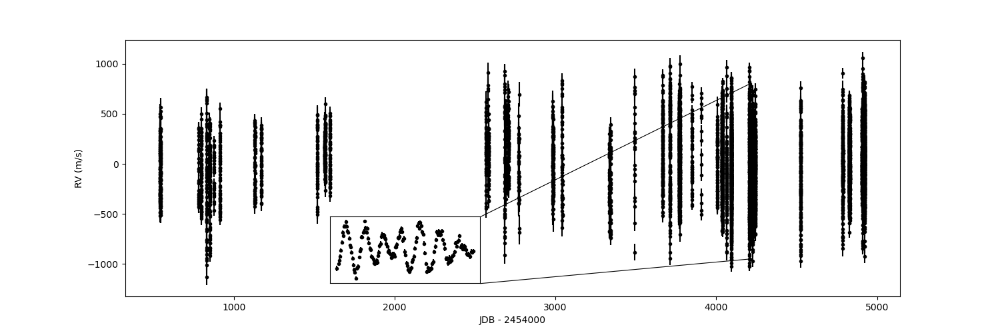

In [6]:
rv_data = np.loadtxt(par_dir + "/data/rv_betapic_carine.txt",usecols=(0,1,2))
rv_time = rv_data[:,0]
rv_flux = rv_data[:,1]*1000
rv_error = rv_data[:,2]*1000
index = np.ndarray.flatten(np.argwhere((rv_time<4209)&(rv_time>4208)))

fig = plt.figure(figsize=(15,5))
ax = fig.add_subplot(111)
ax.errorbar(rv_time,rv_flux,yerr=rv_error,fmt='ok',markersize=3,capsize=0)

ax2 = fig.add_axes([0.33, 0.15, 0.15, 0.2])
ax2.tick_params(
    axis='both',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    left=False,
    right=False,
    labelleft=False,
    labelbottom=False)
ax2.errorbar(rv_time[index],rv_flux[index],yerr=rv_error[index],fmt='ok',markersize=3,capsize=0)
ax.plot([2535,rv_time[index.min()]],[-1194,rv_flux[index].min()],c='k',lw=0.8)
ax.plot([2535,rv_time[index.max()]],[-527,rv_flux[index].max()],c='k',lw=0.8)
ax.set_xlabel("JDB - 2454000")
ax.set_ylabel("RV (m/s)")
plt.savefig(par_dir + "/plots/RV_data.png",bbox_inches='tight')
plt.show()

In [23]:
def gp_building(param,time,flux,error) :
    bounds = dict(log_S0= (None,None), log_Q = (-10,10), log_omega0 = (5,7))
    #kernel = terms.SHOTerm(log_S0=7., log_Q=2.5, log_omega0=5.)
    kernel = terms.SHOTerm(log_S0=param[0], log_Q=param[1], log_omega0=param[2],bounds=bounds)


    gp = celerite.GP(kernel,mean=np.mean(flux))
    gp.compute(time,yerr=error)
 
    print("Initial log likelihood: {0}".format(gp.log_likelihood(flux)))
    print("parameter_dict:\n{0}\n".format(gp.get_parameter_dict()))
    
    return gp

### Définition de la likelihood ###
def log_likelihood(params,gp,time,flux):
    gp.set_parameter_vector(params)
    ll = gp.log_likelihood(flux)
    return ll if np.isfinite(ll) else -np.inf

### Définition du prior (uniforme) ###
def log_prior(params):
    if ((-30 < params[0] < 30) and (-10 < params[1] < 10) and (5 < params[2] < 7)) :
        return 0
    return -np.inf

### Définition du posterior ###
def log_probability(params,gp,time,flux):
    lp = log_prior(params)
    if not np.isfinite(lp):
        return -np.inf
    return lp + log_likelihood(params,gp,time,flux) if np.isfinite(lp) else -np.inf

    ### MCMC ###
def run_mcmc(time,flux,gp,mcmc_params) :
    nwalkers = mcmc_params[0]
    nburnsteps = mcmc_params[1]
    nprogsteps = mcmc_params[2]
    
    initial = gp.get_parameter_vector()
    ndim = len(initial)
    sampler = emcee.EnsembleSampler(nwalkers, ndim, log_probability,args=(gp,time,flux))

    print("Running burn-in...")
    p0 = initial + 1e-8 * np.random.randn(nwalkers, ndim)
    p0, lp, _ = sampler.run_mcmc(p0, nburnsteps,progress=True)

    print("Running production...")
    sampler.reset()
    sampler.run_mcmc(p0, nprogsteps,progress=True)
    print("Finished")
    
    likelihood = gp.log_likelihood(flux)
    af = sampler.acceptance_fraction
    
    print("Mean acceptance fraction:", np.mean(af))
    print("parameter_dict:\n{0}\n".format(gp.get_parameter_dict()))
    print("Final MCMC log likelihood: {0}".format(gp.log_likelihood(flux)))
    return(sampler,likelihood)

def GP_photometry (photometry_names,normalize,initial_params,mcmc_params,figures) :

    for name in photometry_names :

        if ((normalize == False) & (name == "TESS_ALL")) :
            break
        
        elif normalize == True :
            print(name)
            data = np.loadtxt(par_dir + "/data/Photometry/TESS_data/" + name + "_norm_data.txt",usecols=(0,1,2),skiprows = 1, delimiter = ' ')
        
        else : 
            print(name)
            data = np.loadtxt(par_dir + "/data/Photometry/TESS_data/" + name + "_data.txt",usecols=(0,1,2),skiprows = 1, delimiter = ' ')
          
        time = data[:,0]
        flux = data[:,1]
        flux_error = data[:,2]
        gp = gp_building(initial_params,time,flux,flux_error)
        
        
        
        ### Minimize ###
        def neg_log_like(params, y, gp):
            gp.set_parameter_vector(params)
            return -gp.log_likelihood(y)
        # extract our initial guess at parameters
        # from the celerite kernel and put it in a 
        # vector:
        p0 = gp.get_parameter_vector()
        bounds = gp.get_parameter_bounds()

        # run optimization:
        results = minimize(neg_log_like, p0, method='L-BFGS-B',bounds=bounds,args=(flux, gp))
        print(results)
        print("Final log-likelihood: {0}".format(-results.fun))
        print(np.exp(results.x))
        print("Parameters: {0}".format(gp.get_parameter_dict()))
        gp.set_parameter_vector(results.x)
        
        sampler,likelihood = run_mcmc(time,flux,gp,mcmc_params)

        ## Posteriors ###
        flat_samples = sampler.get_chain(discard = 400,thin = 15,flat=True)
        labels = ["ln S0","ln Q","ln $\omega_0$ [day^{-1}]"]

        posteriors = np.array([])
        posteriors_errors = np.array([])
        output_posteriors = np.array([])           
        for i in range(flat_samples.shape[1]):

            mcmc = np.percentile(flat_samples[:, i], [16, 50, 84])
            value = np.percentile(flat_samples[:, i], [50])
            q = np.diff(mcmc)
            txt = "\mathrm{{{3}}} = {0:.3f}_{{-{1:.3f}}}^{{{2:.3f}}}"
            txt = txt.format(mcmc[1], q[0], q[1], labels[i])
            display(Math(txt))
            posteriors = np.append(posteriors,value)
            posteriors_errors = np.append(posteriors_errors,q)
        
        if figures == True :
            
            if normalize == True :
                
                fig = corner.corner(flat_samples, labels=labels, truths=[None,None,np.log(2*np.pi*24*60/30.4)],quantiles=[0.5],show_titles=True,title_fmt = '.3f',levels=(0.68,0.95,0.997))
                axes = np.array(fig.axes).reshape((flat_samples.shape[1], flat_samples.shape[1]))

                for i in range(flat_samples.shape[1]):
                    ax = axes[i,i]
                    ax.fill_between((posteriors[i] - posteriors_errors[i*2],posteriors[i] + posteriors_errors[i*2+1]),len(flat_samples), color='gray', alpha=0.3, edgecolor="none",interpolate=True)
                plt.savefig(par_dir + "/plots/%s/GP_photometry/Posteriors_MCMC_%s_norm_test.pdf"%(name,name),bbox_inches='tight')
                plt.show() 

            else :
                fig = corner.corner(flat_samples, labels=labels, truths=[None,None,np.log(2*np.pi*24*60/30.4)],quantiles=[0.5],show_titles=True,title_fmt = '.3f',levels=(0.68,0.95,0.997))
                axes = np.array(fig.axes).reshape((flat_samples.shape[1], flat_samples.shape[1]))
                for i in range(flat_samples.shape[1]):
                    ax = axes[i, i]
                    ax.fill_between([posteriors[i] - posteriors_errors[i*2],posteriors[i] + posteriors_errors[i*2+1]],len(flat_samples), color='gray', alpha=0.3, edgecolor="none",interpolate=True)
#                 plt.savefig(par_dir + "/plots/%s/GP_photometry/Posteriors_MCMC_%s.pdf"%(name,name),bbox_inches='tight')
                plt.show()
                
   

In [ ]:
# photometry_names = ["TESS_s4","TESS_s5","TESS_s6","TESS_s7","TESS_s32","TESS_s33","TESS_s34","TESS_ALL"]
photometry_names = ["TESS_s5"]
GP_photometry(photometry_names,normalize=True,initial_params=[1,2.5,5.8],mcmc_params=[256,400,15000],figures=True)

TESS_s5
Initial log likelihood: -56780.04993791894
parameter_dict:
OrderedDict([('kernel:log_S0', 1.0), ('kernel:log_Q', 2.5), ('kernel:log_omega0', 5.8)])

      fun: -128253.22295362732
 hess_inv: <3x3 LbfgsInvHessProduct with dtype=float64>
      jac: array([  1.82189979, -13.16948328, -13.50708771])
  message: b'CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH'
     nfev: 132
      nit: 14
   status: 0
  success: True
        x: array([-22.13926351,   3.06721228,   5.75392555])
Final log-likelihood: 128253.22295362732
[2.42683375e-10 2.14819335e+01 3.15426456e+02]
Parameters: OrderedDict([('kernel:log_S0', -22.139263507677043), ('kernel:log_Q', 3.067212279106361), ('kernel:log_omega0', 5.753925562868956)])
Running burn-in...


100%|██████████| 400/400 [07:48<00:00,  1.17s/it]


Running production...


  3%|▎         | 425/15000 [08:20<4:45:59,  1.18s/it]

<IPython.core.display.Javascript object>


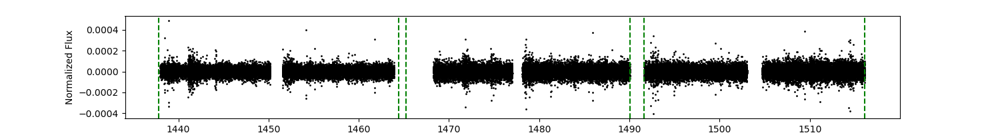

<IPython.core.display.Javascript object>


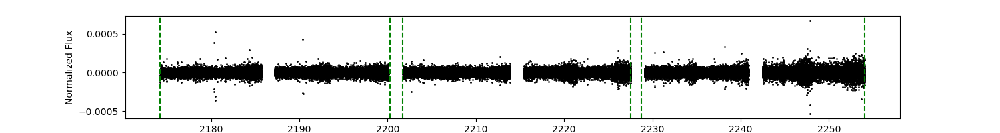

C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\_binned_statistic.py:607: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  result = result[core]


<IPython.core.display.Javascript object>


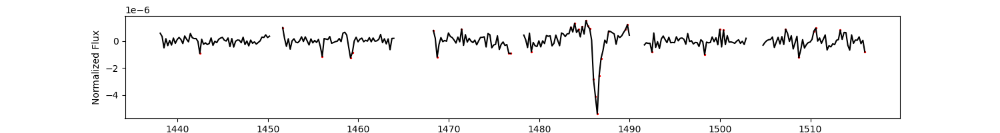

<IPython.core.display.Javascript object>


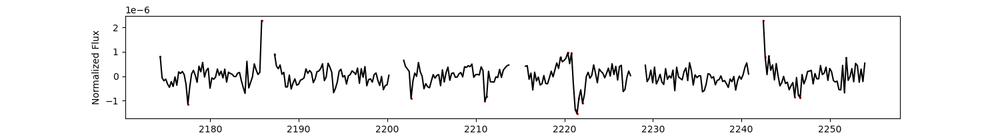

4.313466977054605e-05 7.496876251874288e-07


In [49]:
res_data = np.loadtxt(par_dir+"/data/Photometry/Résidus/Residus_TESS_ALL_norm.txt",skiprows=1)
time_res=res_data[:,0]
res = res_data[:,1]
limits = np.array([1437.82566, 1464.40056, 1465.21262, 1490.04359, 1491.62553,
                   1516.08524, 2174.21898, 2200.23147, 2201.72730, 2227.57173, 2228.74533, 2254.06476])

plt.figure(figsize=(15,2))
index = np.ndarray.flatten(np.argwhere(time_res<1520))
plt.scatter(time_res[index],res[index],s=1,color='k')

for i in range(6) : 
    plt.axvline(limits[i],ls='--',c='g')

plt.xlabel("TJD (days)")
plt.ylabel("Normalized Flux")
# plt.savefig(par_dir + "/plots/Photometry_final_s4_7.png",bbox_inches='tight')
plt.show()

plt.figure(figsize=(15,2))
index = np.ndarray.flatten(np.argwhere(time_res>1520))
plt.scatter(time_res[index],res[index],s=1,color='k')
for i in range(6,len(limits)) : 
    plt.axvline(limits[i],ls='--',c='g')
plt.xlabel("TJD (days)")
plt.ylabel("Normalized Flux")
# plt.savefig(par_dir + "/plots/Photometry_final_s32_34.png",bbox_inches='tight')
plt.show()



time_bins = np.arange(np.min(time_res),np.max(time_res)+ 300/1440, 300/1440)
residus_bins,time_bins_edges,number = stats.binned_statistic(time_res,res,statistic='mean',bins=time_bins)
time_bins_width = (time_bins_edges[1] - time_bins_edges[0])
time_bins_centers = time_bins_edges[1:] - time_bins_width/2

index = np.argwhere(~np.isnan(residus_bins))
time_bins_centers = np.ndarray.flatten(time_bins_centers[index])
residus_bins = np.ndarray.flatten(residus_bins[index])

limits = np.array([1437.82566, 1450.20, 1451.547, 1464.40056, 1468.21262, 1477.025, 1478.1, 1490.05, 1491.62553,
                           1503.04, 1504.68, 1516.09, 2174.21898, 2185.94, 2186.938, 2200.23147, 2201.72730, 2213.87, 
                           2215.42, 2227.575, 2228.74533, 2240.91,2241.98, 2254.0676])
plt.figure(figsize=(15,2))
# index = np.ndarray.flatten(np.argwhere(time_bins_centers<1520))
# plt.scatter(time_bins_centers[index],residus_bins[index],s=1,color='k')
# plt.plot(time_bins_centers[index],residus_bins[index],color='k')
for i in range(np.int(len(limits)/2)) : 
#     plt.axvline(limits[i],ls='--',c='g')
    index = np.ndarray.flatten(np.argwhere((time_bins_centers<1520)&(time_bins_centers<limits[i*2+1])&(time_bins_centers>limits[i*2])))
    plt.plot(time_bins_centers[index],residus_bins[index],color='k')
    index2 = np.ndarray.flatten(np.argwhere((time_bins_centers<1520)&(time_bins_centers<limits[i*2+1])&(time_bins_centers>limits[i*2])&(np.abs(residus_bins)>np.std(residus_bins))))
    plt.scatter(time_bins_centers[(index2)],residus_bins[(index2)],c='r',s=2)
plt.xlabel("TJD (days)")
plt.ylabel("Normalized Flux")
# plt.savefig(par_dir + "/plots/Photometry_final_s4_7.png",bbox_inches='tight')
plt.show()

plt.figure(figsize=(15,2))

# plt.scatter(time_bins_centers[index],residus_bins[index],s=1,color='k')

for i in range(np.int(len(limits)/2)) : 
#     plt.axvline(limits[i],ls='--',c='g')
    index = np.ndarray.flatten(np.argwhere((time_bins_centers>1520)&(time_bins_centers<limits[i*2+1])&(time_bins_centers>limits[i*2])))
    plt.plot(time_bins_centers[index],residus_bins[index],color='k')
    index2 = np.ndarray.flatten(np.argwhere((time_bins_centers>1520)&(time_bins_centers<limits[i*2+1])&(time_bins_centers>limits[i*2])&(np.abs(residus_bins)>np.std(residus_bins))))
    plt.scatter(time_bins_centers[(index2)],residus_bins[(index2)],c='r',s=2)

plt.xlabel("TJD (days)")
plt.ylabel("Normalized Flux")
# plt.savefig(par_dir + "/plots/Photometry_final_s32_34.png",bbox_inches='tight')
plt.show()

rms = np.sqrt(np.mean(res**2))
rms_bin = np.sqrt(np.mean(residus_bins**2))
print(rms,rms_bin)


<IPython.core.display.Javascript object>


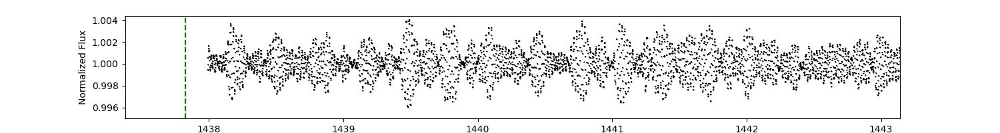

<IPython.core.display.Javascript object>


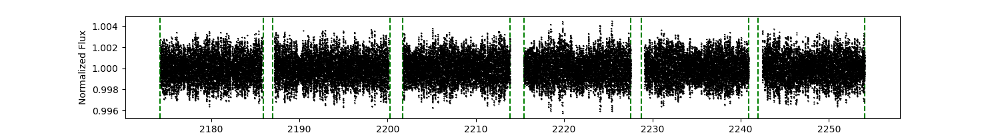

In [50]:
photo_data = np.loadtxt(par_dir + "/data/Photometry/TESS_data/TESS_ALL_norm_data.txt",usecols=(0,1,2),skiprows = 1, delimiter = ' ')
time = photo_data[:,0]
flux = photo_data[:,1]
flux_error = photo_data[:,2]
limits = np.array([1437.82566, 1450.20, 1451.547, 1464.40056, 1468.21262, 1477.025, 1478.1, 1490.05, 1491.62553,
                           1503.04, 1504.68, 1516.09, 2174.21898, 2185.94, 2186.938, 2200.23147, 2201.72730, 2213.87, 
                           2215.42, 2227.575, 2228.74533, 2240.91,2241.98, 2254.0676])
plt.figure(figsize=(15,2))
index = np.ndarray.flatten(np.argwhere(time<1520))
plt.errorbar(time[index],flux[index],flux_error[index],fmt='.',markersize=1,capsize=0,color='k')
for i in range(12) : 
    plt.axvline(limits[i],ls='--',c='g')
plt.xlabel("TJD (days)")
plt.ylabel("Normalized Flux")
# plt.savefig(par_dir + "/plots/Photometry_final_s4_7.png",bbox_inches='tight')
plt.show()

plt.figure(figsize=(15,2))
index = np.ndarray.flatten(np.argwhere(time>1520))
plt.errorbar(time[index],flux[index],flux_error[index],fmt='.',markersize=1,capsize=0,color='k')
for i in range(12,len(limits)) : 
    plt.axvline(limits[i],ls='--',c='g')
plt.xlabel("TJD (days)")
plt.ylabel("Normalized Flux")
# plt.savefig(par_dir + "/plots/Photometry_final_s32_34.png",bbox_inches='tight')
plt.show()

In [62]:
def photometry_periodo_residus (photometry_names,time_binning,periods,normalize,figures) :
    for name in photometry_names :

        if ((normalize == False) & (name == "TESS_ALL")) :
            break
        
        elif normalize == True :
            print(name)
            photo_data = np.loadtxt(par_dir + "/data/Photometry/TESS_data/" + name + "_norm_data.txt",usecols=(0,1,2),skiprows = 1, delimiter = ' ')
            gp_photo_data = np.genfromtxt(par_dir + "/data/Photometry/GP_photometry_data/" + name + "_norm_photometry_posteriors.txt",usecols=1, delimiter = ' ')
            
        else : 
            print(name)
            photo_data = np.loadtxt(par_dir + "/data/Photometry/TESS_data/" + name + "_data.txt",usecols=(0,1,2),skiprows = 1, delimiter = ' ')
            gp_photo_data = np.genfromtxt(par_dir + "/data/Photometry/GP_photometry_data/" + name + "_photometry_posteriors.txt",usecols=1, delimiter = ' ')
            
        time = photo_data[:,0]
        flux = photo_data[:,1]
        flux_error = photo_data[:,2]
        posteriors = gp_photo_data[:3]
        
        mean =np.array([])
        gp = gp_building(posteriors,time,flux,flux_error)
        limits = np.array([1437.82566, 1450.20, 1451.547, 1464.40056, 1468.21262, 1477.025, 1478.1, 1490.05, 1491.62553,
                           1503.04, 1504.68, 1516.09, 2174.21898, 2185.94, 2186.938, 2200.23147, 2201.72730, 2213.87, 
                           2215.42, 2227.575, 2228.74533, 2240.91,2241.98, 2254.0676])
        for j in range(np.int(len(limits)/2)) :
            print(limits[j*2],"/",limits[j*2+1])
            index = np.ndarray.flatten(np.argwhere((time<limits[j*2+1])&(time>limits[j*2])))
            pred_mean, pred_var = gp.predict(flux, time[index], return_var=True)
            mean = np.append(mean,pred_mean)
            
        index = np.argwhere(~np.isnan(mean))
        time = np.ndarray.flatten(time[index])
        flux = np.ndarray.flatten(flux[index])
        flux_error = np.ndarray.flatten(flux_error[index])
        mean = np.ndarray.flatten(mean[index])    
        
        residus = flux - mean
        freqs = 1/periods
        flux_power = LombScargle(time,flux - np.mean(flux),flux_error,normalization='standard').power(freqs)
        residus_power = LombScargle(time,residus - np.mean(residus),normalization='standard').power(freqs)
        
#         time_bins = np.arange(np.min(time),np.max(time)+ time_binning, time_binning)
#         flux_bins,time_bins_edges,number = stats.binned_statistic(time,flux,statistic='mean',bins=time_bins)
#         flux_error_bins,time_bins_edges,number = stats.binned_statistic(time,flux_error,statistic='mean',bins=time_bins)
#         residus_bins,time_bins_edges,number = stats.binned_statistic(time,residus,statistic='mean',bins=time_bins)
#         time_bins_width = (time_bins_edges[1] - time_bins_edges[0])
#         time_bins_centers = time_bins_edges[1:] - time_bins_width/2
        
#         index = np.argwhere(~np.isnan(flux_bins))
#         time_bins_centers = np.ndarray.flatten(time_bins_centers[index])
#         residus_bins = np.ndarray.flatten(residus_bins[index])
#         flux_bins = np.ndarray.flatten(flux_bins[index])
#         flux_error_bins = np.ndarray.flatten(flux_error_bins[index])
        
#         flux_bins_power = LombScargle(time_bins_centers,flux_bins - np.mean(flux_bins),flux_error_bins,normalization='standard').power(freqs)
#         residus_bins_power = LombScargle(time_bins_centers,residus_bins - np.mean(residus_bins),normalization='standard').power(freqs)
        
#         if normalize == True :
#             file_periodo = open(par_dir + "/data/Photometry/Periodo/Periodo_" + name + "_norm.txt","w")
#             file_periodo_bins = open(par_dir + "/data/Photometry/Periodo/Periodo_" + name + "_norm_binned_%sj.txt"%time_binning,"w")
#             file_periodo_residus = open(par_dir + "/data/Photometry/Periodo/Periodo_Residus_" + name + "_norm.txt","w")
#             file_periodo_residus_bins = open(par_dir + "/data/Photometry/Periodo/Periodo_Residus_" + name + "_norm_binned_%sj.txt"%time_binning,"w")
#             file_residus = open(par_dir + "/data/Photometry/Résidus/Residus_" + name + "_norm.txt","w")
#             file_residus_bins = open(par_dir + "/data/Photometry/Résidus/Residus_" + name + "_norm_binned_%sj.txt"%time_binning,"w")
        
#         else :
#             file_periodo = open(par_dir + "/data/Photometry/Periodo/Periodo_" + name + ".txt","w")
#             file_periodo_bins = open(par_dir + "/data/Photometry/Periodo/Periodo_" + name + "_binned_%sj.txt"%time_binning,"w")
#             file_periodo_residus = open(par_dir + "/data/Photometry/Periodo/Periodo_Residus_" + name + ".txt","w")
#             file_periodo_residus_bins = open(par_dir + "/data/Photometry/Periodo/Periodo_Residus_" + name + "_binned_%sj.txt"%time_binning,"w")
#             file_residus = open(par_dir + "/data/Photometry/Résidus/Residus_" + name + ".txt","w")
#             file_residus_bins = open(par_dir + "/data/Photometry/Résidus/Residus_" + name + "_binned_%sj.txt"%time_binning,"w")
        
#         np.savetxt(file_periodo,np.column_stack((periods,flux_power)),header="Period Power",delimiter=' ')
#         np.savetxt(file_periodo_bins,np.column_stack((periods,flux_bins_power)),header="Period Power",delimiter=' ')
#         np.savetxt(file_periodo_residus,np.column_stack((periods,residus_power)),header="Period Power",delimiter=' ')
#         np.savetxt(file_periodo_residus_bins,np.column_stack((periods,residus_bins_power)),header="Period Power",delimiter=' ')
#         np.savetxt(file_residus,np.column_stack((time,residus)),header="Time Residus",delimiter=' ')
#         np.savetxt(file_residus_bins,np.column_stack((time_bins_centers,residus_bins)),header="Time Residus",delimiter=' ')
       
#         file_periodo.close()
#         file_periodo_bins.close()
#         file_periodo_residus.close()
#         file_periodo_residus_bins.close()
#         file_residus.close()
#         file_residus_bins.close()
        
#         if figures == True :
#             if normalize == False :

#                 plt.figure()
#                 plt.scatter(time,residus,c='k',s=1)
#                 plt.title("Residus %s"%name)
#                 plt.xlabel("Time (JD)")
#                 plt.ylabel("Normalized flux")
#                 plt.savefig(par_dir + "/plots/%s/GP_photometry/Residus_%s.pdf"%(name,name),bbox_inches='tight')
#                 plt.show()

#                 plt.figure()
#                 plt.scatter(time_bins_centers,residus_bins,c='k',s=1)
#                 plt.title("Residus %s binned %sj"%(name,time_binning))
#                 plt.xlabel("Time (JD)")
#                 plt.ylabel("Normalized flux")
#                 plt.savefig(par_dir + "/plots/%s/GP_photometry/Residus_%s_binned_%sj.pdf"%(name,name,time_binning),bbox_inches='tight')
#                 plt.show()

#                 plt.figure()
#                 plt.semilogx(periods,flux_power,c='k')
#                 plt.title("Periodo %s"%name)
#                 plt.xlabel("Period (days)")
#                 plt.ylabel("Normalized power")
#                 plt.savefig(par_dir + "/plots/%s/GP_photometry/Periodo_%s.pdf"%(name,name),bbox_inches='tight')
#                 plt.show()

#                 plt.figure()
#                 plt.semilogx(periods,residus_power,c='k')
#                 plt.title("Periodo Residus %s"%name)
#                 plt.xlabel("Period (days)")
#                 plt.ylabel("Normalized power")
#                 plt.savefig(par_dir + "/plots/%s/GP_photometry/Periodo_Residus_%s.pdf"%(name,name),bbox_inches='tight')
#                 plt.show()

#                 plt.figure()
#                 plt.semilogx(periods,flux_bins_power,c='k')
#                 plt.title("Periodo %s binned %sj"%(name,time_binning))
#                 plt.xlabel("Period (days)")
#                 plt.ylabel("Normalized power")
#                 plt.savefig(par_dir + "/plots/%s/GP_photometry/Periodo_%s_binned_%sj.pdf"%(name,name,time_binning),bbox_inches='tight')
#                 plt.show()

#                 plt.figure()
#                 plt.semilogx(periods,residus_bins_power,c='k')
#                 plt.title("Periodo Residus %s binned %sj"%(name,time_binning))
#                 plt.xlabel("Period (days)")
#                 plt.ylabel("Normalized power")
#                 plt.savefig(par_dir + "/plots/%s/GP_photometry/Periodo_Residus_%s_binned_%sj.pdf"%(name,name,time_binning),bbox_inches='tight')
#                 plt.show()
                
#             else :
#                 plt.figure()
#                 plt.scatter(time,residus,c='k',s=1)
#                 plt.title("Residus %s"%name)
#                 plt.xlabel("Time (JD)")
#                 plt.ylabel("Normalized flux")
#                 plt.savefig(par_dir + "/plots/%s/GP_photometry/Residus_%s_norm.pdf"%(name,name),bbox_inches='tight')
#                 plt.show()

#                 plt.figure()
#                 plt.scatter(time_bins_centers,residus_bins,c='k',s=1)
#                 plt.title("Residus %s binned %sj"%(name,time_binning))
#                 plt.xlabel("Time (JD)")
#                 plt.ylabel("Normalized flux")
#                 plt.savefig(par_dir + "/plots/%s/GP_photometry/Residus_%s_norm_binned_%sj.pdf"%(name,name,time_binning),bbox_inches='tight')
#                 plt.show()

#                 plt.figure()
#                 plt.semilogx(periods,flux_power,c='k')
#                 plt.title("Periodo %s"%name)
#                 plt.xlabel("Period (days)")
#                 plt.ylabel("Normalized power")
#                 plt.savefig(par_dir + "/plots/%s/GP_photometry/Periodo_%s_norm.pdf"%(name,name),bbox_inches='tight')
#                 plt.show()

#                 plt.figure()
#                 plt.semilogx(periods,residus_power,c='k')
#                 plt.title("Periodo Residus %s"%name)
#                 plt.xlabel("Period (days)")
#                 plt.ylabel("Normalized power")
#                 plt.savefig(par_dir + "/plots/%s/GP_photometry/Periodo_Residus_%s_norm.pdf"%(name,name),bbox_inches='tight')
#                 plt.show()

#                 plt.figure()
#                 plt.semilogx(periods,flux_bins_power,c='k')
#                 plt.title("Periodo %s binned %sj"%(name,time_binning))
#                 plt.xlabel("Period (days)")
#                 plt.ylabel("Normalized power")
#                 plt.savefig(par_dir + "/plots/%s/GP_photometry/Periodo_%s_norm_binned_%sj.pdf"%(name,name,time_binning),bbox_inches='tight')
#                 plt.show()

#                 plt.figure()
#                 plt.semilogx(periods,residus_bins_power,c='k')
#                 plt.title("Periodo Residus %s binned %sj"%(name,time_binning))
#                 plt.xlabel("Period (days)")
#                 plt.ylabel("Normalized power")
#                 plt.savefig(par_dir + "/plots/%s/GP_photometry/Periodo_Residus_%s_norm_binned_%sj.pdf"%(name,name,time_binning),bbox_inches='tight')
#                 plt.show()
    return residus,flux_power,residus_power

In [52]:
def mean_building (gp,time,flux) :
    print(len(time))
    mean = np.array([])
    t = [i*1000 for i in range(0,1000)]
    for it in range(len(t)+1):
        if ((np.abs(np.argmax(time) - t[it])) < (t[it+1] - t[it])) :
            x = time[t[it]:np.argmax(time)+1]
            print(t[it]," : ",np.argmax(time)+1)
            pred_mean, pred_var = gp.predict(flux, x, return_var=True)
            mean = np.append(mean,pred_mean)
            break
        x = time[t[it]:t[it+1]]
        print(t[it],":",t[it+1])
        pred_mean, pred_var = gp.predict(flux, x, return_var=True)
        mean = np.append(mean,pred_mean)
    return mean

In [55]:
def gp_building(param,time,flux,error) :
    bounds = dict(log_S0= (None,None), log_Q = (-10,10), log_omega0 = (5,7))
    #kernel = terms.SHOTerm(log_S0=7., log_Q=2.5, log_omega0=5.)
    kernel = terms.SHOTerm(log_S0=param[0], log_Q=param[1], log_omega0=param[2],bounds=bounds)


    gp = celerite.GP(kernel,mean=np.mean(flux))
    gp.compute(time,yerr=error)
 
    print("Initial log likelihood: {0}".format(gp.log_likelihood(flux)))
    print("parameter_dict:\n{0}\n".format(gp.get_parameter_dict()))
    
    return gp

In [63]:
# photometry_names = ["TESS_s4","TESS_s5","TESS_s6","TESS_s7","TESS_s32","TESS_s33","TESS_s34","TESS_ALL"]
photometry_names = ["TESS_ALL"]
time_binning = 0.15
periods = np.arange(0.01,100,0.0001)
residus,flux_power,residus_power = photometry_periodo_residus(photometry_names,time_binning,periods,normalize=True,figures=True)

TESS_ALL
Initial log likelihood: 713485.1491796048
parameter_dict:
OrderedDict([('kernel:log_S0', -21.534583156376208), ('kernel:log_Q', 2.4064048052780627), ('kernel:log_omega0', 5.749413859765567)])

1437.82566 / 1450.2
1451.547 / 1464.40056
1468.21262 / 1477.025
1478.1 / 1490.05
1491.62553 / 1503.04
1504.68 / 1516.09
2174.21898 / 2185.94
2186.938 / 2200.23147
2201.7273 / 2213.87
2215.42 / 2227.575
2228.74533 / 2240.91
2241.98 / 2254.0676


In [138]:
rv_data = np.loadtxt(par_dir + "/data/rv_betapic_carine.txt",usecols=(0,1,2))
rv_time = rv_data[:,0]
rv_full = rv_data[:,1]*1000
rv_error_full = rv_data[:,2]*1000
periods = np.arange(1,20000,0.01)
freqs = 1/periods
rv_power = LombScargle(rv_time,rv_full - np.mean(rv_full),rv_error_full,normalization='standard').power(freqs)

In [139]:
rv_offsets_data = np.loadtxt(par_dir + "/data/RV_offsets_TESS_ALL.txt",usecols=(0,1,2,3),skiprows = 1, delimiter = ' ')
rv_offsets_time = rv_offsets_data[:,0]
rv_offsets = rv_offsets_data[:,1]
rv_offsets_error = rv_offsets_data[:,2:4].T

periods = np.arange(1,20000,0.01)
freqs = 1/periods
rv_offsets_power = LombScargle(rv_offsets_time,rv_offsets - np.mean(rv_offsets),normalization='standard').power(freqs)


In [140]:
rv_residus_data = np.loadtxt(par_dir + "/data/RV/Résidus/RV_Residus_TESS_ALL_norm.txt",usecols=(0,1,2),skiprows = 1, delimiter = ' ')
rv_residus_time = rv_residus_data[:,0]
rv_residus = rv_residus_data[:,1]
# rv_residus_error = rv_residus_data[:,2]
periods = np.arange(1,20000,0.01)
freqs = 1/periods
rv_residus_power = LombScargle(rv_residus_time,rv_residus - np.mean(rv_residus),normalization='standard').power(freqs)

In [128]:
photo_data = np.loadtxt(par_dir + "/data/Photometry/TESS_data/TESS_ALL_norm_data.txt",usecols=(0,1,2),skiprows = 1, delimiter = ' ')
photo_time = photo_data[:,0]
periods = np.arange(0.01,100,0.0001)
freqs = 1/periods
window_power = LombScargle(photo_time,photo_time,normalization='standard').power(freqs)

In [142]:
photo_time = photo_data[:,0]
photo_flux = photo_data[:,1]
photo_flux_error = photo_data[:,2]
periods = np.arange(0.01,100,0.0001)
freqs = 1/periods
flux_power = LombScargle(photo_time,photo_flux - np.mean(photo_flux),normalization='standard').power(freqs)

In [143]:
periods = np.arange(0.01,100,0.0001)
freqs = 1/periods
residus_power = LombScargle(time_res,residus - np.mean(residus),normalization='standard').power(freqs)

<IPython.core.display.Javascript object>


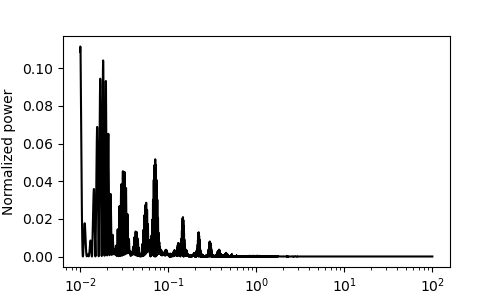

In [302]:
periods = np.arange(0.01,100,0.0001)
freqs = 1/periods
plt.figure(figsize=(5,3))
plt.semilogx(freqs,window_power,c='k')
plt.xlabel("Frequency [d$^{-1}$]")
plt.ylabel("Normalized power")
plt.savefig(par_dir + "/plots/Periodo_window_TESS_ALL_norm.png",bbox_inches='tight')
plt.show()

In [300]:
periods = np.arange(1,20000,0.01)
freqs = 1/periods
rv_window_power = LombScargle(rv_time,rv_time,normalization='standard').power(freqs)

In [308]:
periods = np.arange(1,20000,0.01)
freqs = 1/periods
plt.figure(figsize=(5,3))
plt.semilogx(periods,rv_window_power,c='k')
plt.xlabel("Period [d]")
plt.ylabel("Normalized power")
plt.axvline(p_c,c='b',ls='-')
plt.axvline(p_b,c="r",ls='-')
plt.savefig(par_dir + "/plots/Periodo_window_RV.png",bbox_inches='tight')
plt.show()

<IPython.core.display.Javascript object>

In [219]:
photo_data = np.loadtxt(par_dir + "/data/Photometry/TESS_data/TESS_ALL_norm_data.txt",usecols=(0,1,2),skiprows = 1, delimiter = ' ')
gp_photo_data = np.genfromtxt(par_dir + "/data/Photometry/GP_photometry_data/TESS_ALL_norm_photometry_posteriors.txt",usecols=1, delimiter = ' ')

time = photo_data[:,0]
flux = photo_data[:,1]
flux_error = photo_data[:,2]
posteriors = gp_photo_data[:3]
index = np.ndarray.flatten(np.argwhere((time<1473)&(time>1472)))

gp = gp_building(posteriors,time[index],flux[index],flux_error[index])

x = np.linspace(np.min(time[index])-0.1,np.max(time[index])+0.1,5000)
pred_mean, pred_var = gp.predict(flux[index], x, return_var=True)
pred_std = np.sqrt(pred_var)

Initial log likelihood: 4936.092385785519
parameter_dict:
OrderedDict([('kernel:log_S0', -21.534583156376208), ('kernel:log_Q', 2.4064048052780627), ('kernel:log_omega0', 5.749413859765567)])



<IPython.core.display.Javascript object>


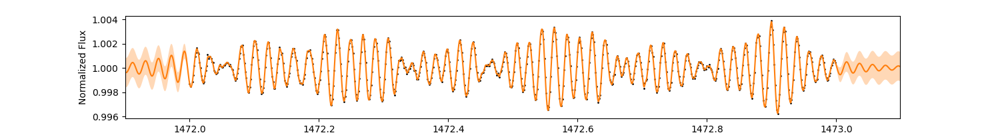

In [222]:
color = "#ff7f0e"
plt.figure(figsize=(15,2))
plt.plot(x,pred_mean,color=color)
plt.fill_between(x, pred_mean+pred_std, pred_mean-pred_std, color=color, alpha=0.3,
                 edgecolor="none")
plt.scatter(time[index],flux[index],s=1,c='k')
plt.xlabel("Time (TJD)")
plt.ylabel("Normalized Flux")
plt.xlim(x.min(),x.max())
plt.savefig(par_dir + "/plots/Fit_1472_1473.png",bbox_inches='tight')
plt.show()

C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\_binned_statistic.py:607: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  result = result[core]


<IPython.core.display.Javascript object>


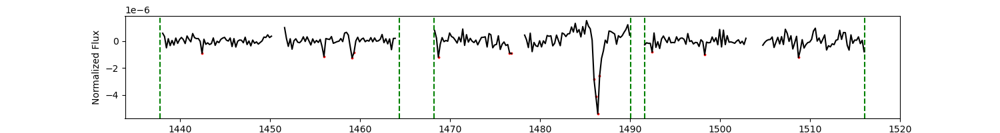

<IPython.core.display.Javascript object>


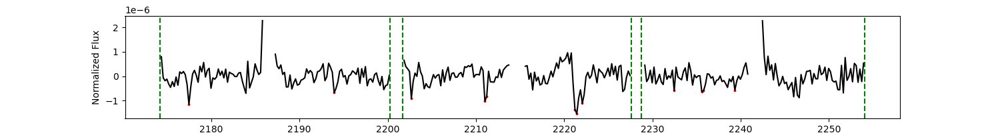

4.313466977054605e-05 7.496876251874288e-07
[1442.47205514 1456.01372181 1459.13872181 1459.34705514 1468.72205514
 1476.63872181 1476.84705514 1486.01372181 1486.22205514 1486.43038848
 1486.63872181 1492.47205514 1498.30538848 1508.72205514 2177.47205514
 2193.93038848 2202.68038848 2211.01372181 2211.22205514 2221.22205514
 2221.43038848 2222.05538848 2232.47205514 2235.59705514 2235.80538848
 2239.34705514]


In [314]:
photo_data = np.loadtxt(par_dir + "/data/Photometry/TESS_data/TESS_ALL_norm_data.txt",usecols=(0,1,2),skiprows = 1, delimiter = ' ')
time = photo_data[:,0]
flux = photo_data[:,1]
flux_error = photo_data[:,2]

# plt.savefig(par_dir + "/plots/%s/GP_photometry/Residus_%s_norm.pdf"%(name,name),bbox_inches='tight')

limits = np.array([1437.82566, 1450.20, 1451.547, 1464.40056, 1468.21262, 1477.025, 1478.1, 1490.05, 1491.62553,
                           1503.04, 1504.68, 1516.09, 2174.21898, 2185.94, 2186.938, 2200.23147, 2201.72730, 2213.87, 
                           2215.42, 2227.575, 2228.74533, 2240.91,2241.98, 2254.0676])

limits_vert = np.array([1437.82566, 1464.40056, 1468.21262,1490.05, 1491.62553,
                           1516.09, 2174.21898, 2200.23147, 2201.72730, 2227.575, 2228.74533, 2254.0676])

# plt.figure(figsize=(9,2))
# index = np.ndarray.flatten(np.argwhere(time<1520))
# plt.scatter(time[index],flux[index],s=1,color='k')
# for i in range(12) : 
#     plt.axvline(limits[i],ls='--',c='g')
# plt.xlabel("TJD (days)")
# plt.ylabel("Normalized Flux")
# plt.title("photométrie")
# # plt.savefig(par_dir + "/plots/Photometry_final_s4_7.png",bbox_inches='tight')
# plt.show()

# plt.figure(figsize=(9,2))
# index = np.ndarray.flatten(np.argwhere(time>1520))
# plt.scatter(time[index],flux[index],s=1,color='k')
# for i in range(12,len(limits)) : 
#     plt.axvline(limits[i],ls='--',c='g')
# plt.xlabel("TJD (days)")
# plt.ylabel("Normalized Flux")
# plt.title("photométrie")
# # plt.savefig(par_dir + "/plots/Photometry_final_s32_34.png",bbox_inches='tight')
# plt.show()

# plt.figure(figsize=(15,2))
# index = np.ndarray.flatten(np.argwhere(time<1520))
# plt.scatter(time[index],res[index],s=1,color='k')
# for i in range(6) : 
#     plt.axvline(limits_vert[i],ls='--',c='g')
# plt.xlabel("TJD (days)")
# plt.ylabel("Normalized Flux")
# plt.savefig(par_dir + "/plots/residus_s5_7.png",bbox_inches='tight')
# plt.show()

# plt.figure(figsize=(15,2))
# index = np.ndarray.flatten(np.argwhere(time>1520))
# plt.scatter(time[index],res[index],s=1,color='k')
# for i in range(6,len(limits_vert)) : 
#     plt.axvline(limits_vert[i],ls='--',c='g')
# plt.xlabel("TJD (days)")
# plt.ylabel("Normalized Flux")
# plt.savefig(par_dir + "/plots/residus_s32_34.png",bbox_inches='tight')
# plt.show()

time_bins = np.arange(np.min(time_res),np.max(time_res)+ 300/1440, 300/1440)
residus_bins,time_bins_edges,number = stats.binned_statistic(time_res,res,statistic='mean',bins=time_bins)
time_bins_width = (time_bins_edges[1] - time_bins_edges[0])
time_bins_centers = time_bins_edges[1:] - time_bins_width/2
index = np.argwhere(~np.isnan(residus_bins))
time_bins_centers = np.ndarray.flatten(time_bins_centers[index])
residus_bins = np.ndarray.flatten(residus_bins[index])
time_transits = np.array([])

plt.figure(figsize=(15,2))
# index = np.ndarray.flatten(np.argwhere(time_bins_centers<1520))
# plt.scatter(time_bins_centers[index],residus_bins[index],s=1,color='k')
# plt.plot(time_bins_centers[index],residus_bins[index],color='k')
for i in range(6) : 
    plt.axvline(limits_vert[i],ls='--',c='g')
for i in range(6) : 
    index = np.ndarray.flatten(np.argwhere((time_bins_centers<limits[i*2+1])&(time_bins_centers>limits[i*2])))
    time_transit = time_bins_centers[index]
    flux_transit = residus_bins[index]
    plt.plot(time_transit,flux_transit,color='k')    
    index2 = np.ndarray.flatten(np.argwhere((np.abs(flux_transit)>2*np.std(flux_transit))&(flux_transit<0)))
    plt.scatter(time_transit[index2],flux_transit[index2],s=3,color='r')
    time_transits = np.append(time_transits,time_transit[index2])
plt.xlabel("TJD (days)")
plt.ylabel("Normalized Flux")

plt.savefig(par_dir + "/plots/residus_s5_7.png",bbox_inches='tight')
plt.show()

plt.figure(figsize=(15,2))

# plt.scatter(time_bins_centers[index],residus_bins[index],s=1,color='k')
for i in range(6,len(limits_vert)) : 
    plt.axvline(limits_vert[i],ls='--',c='g')
for i in range(6,np.int(len(limits_vert))) : 
    index = np.ndarray.flatten(np.argwhere((time_bins_centers<limits[i*2+1])&(time_bins_centers>limits[i*2])))
    time_transit = time_bins_centers[index]
    flux_transit = residus_bins[index]
    plt.plot(time_transit,flux_transit,color='k')    
    index2 = np.ndarray.flatten(np.argwhere((np.abs(flux_transit)>2*np.std(flux_transit))&(flux_transit<0)))
    plt.scatter(time_transit[index2],flux_transit[index2],s=3,color='r')
    time_transits = np.append(time_transits,time_transit[index2])

plt.xlabel("TJD (days)")
plt.ylabel("Normalized Flux")

plt.savefig(par_dir + "/plots/residus_s32_34.png",bbox_inches='tight')
plt.show()

rms = np.sqrt(np.mean(res**2))
rms_bin = np.sqrt(np.mean(residus_bins**2))
print(rms,rms_bin)
print(time_transits)




In [315]:
file = open(par_dir + "/data/time_transits_gp.txt",'w')
np.savetxt(file,time_transits)
file.close()

<IPython.core.display.Javascript object>


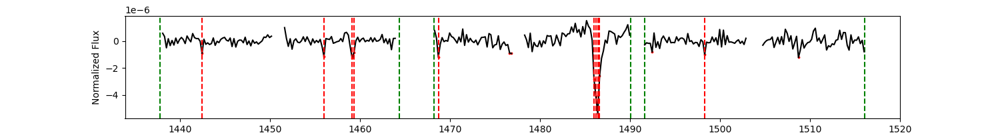

<IPython.core.display.Javascript object>


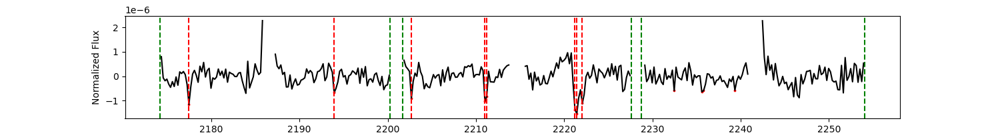

[1442.47205514 1456.01372181 1459.13872181 1459.34705514 1468.72205514
 1486.01372181 1486.22205514 1486.43038848 1486.63872181 1498.30538848
 2177.47205514 2193.93038848 2202.68038848 2211.01372181 2211.22205514
 2221.22205514 2221.43038848 2222.05538848]


In [319]:
indexes = np.array([ 0,  1,  2,  3,  4,  7,  8,  9, 10, 12, 14, 15, 16, 17,
        18, 19, 20, 21]).astype(int)
test = time_transits[indexes]
plt.figure(figsize=(15,2))
# index = np.ndarray.flatten(np.argwhere(time_bins_centers<1520))
# plt.scatter(time_bins_centers[index],residus_bins[index],s=1,color='k')
# plt.plot(time_bins_centers[index],residus_bins[index],color='k')
for i in range(6) : 
    plt.axvline(limits_vert[i],ls='--',c='g')
for i in range(6) : 
    index = np.ndarray.flatten(np.argwhere((time_bins_centers<limits[i*2+1])&(time_bins_centers>limits[i*2])))
    time_transit = time_bins_centers[index]
    flux_transit = residus_bins[index]
    plt.plot(time_transit,flux_transit,color='k')    
    index2 = np.ndarray.flatten(np.argwhere((np.abs(flux_transit)>2*np.std(flux_transit))&(flux_transit<0)))
    plt.scatter(time_transit[index2],flux_transit[index2],s=3,color='r')
    index3 = np.ndarray.flatten(np.argwhere((test<limits[i*2+1])&(test>limits[i*2])))
    for j in test[index3] :
        plt.axvline(j,ls='--',c='r')
    
#     time_transits = np.append(time_transits,time_transit[index2])
plt.xlabel("TJD (days)")
plt.ylabel("Normalized Flux")

plt.savefig(par_dir + "/plots/residus_s5_7.png",bbox_inches='tight')
plt.show()

plt.figure(figsize=(15,2))

# plt.scatter(time_bins_centers[index],residus_bins[index],s=1,color='k')
for i in range(6,len(limits_vert)) : 
    plt.axvline(limits_vert[i],ls='--',c='g')
for i in range(6,np.int(len(limits_vert))) : 
    index = np.ndarray.flatten(np.argwhere((time_bins_centers<limits[i*2+1])&(time_bins_centers>limits[i*2])))
    time_transit = time_bins_centers[index]
    flux_transit = residus_bins[index]
    plt.plot(time_transit,flux_transit,color='k')    
    index2 = np.ndarray.flatten(np.argwhere((np.abs(flux_transit)>2*np.std(flux_transit))&(flux_transit<0)))
    plt.scatter(time_transit[index2],flux_transit[index2],s=3,color='r')
#     time_transits = np.append(time_transits,time_transit[index2])
    index3 = np.ndarray.flatten(np.argwhere((test<limits[i*2+1])&(test>limits[i*2])))
    for j in test[index3] :
        plt.axvline(j,ls='--',c='r')
plt.xlabel("TJD (days)")
plt.ylabel("Normalized Flux")

plt.savefig(par_dir + "/plots/residus_s32_34.png",bbox_inches='tight')
plt.show()
print(test)

<IPython.core.display.Javascript object>


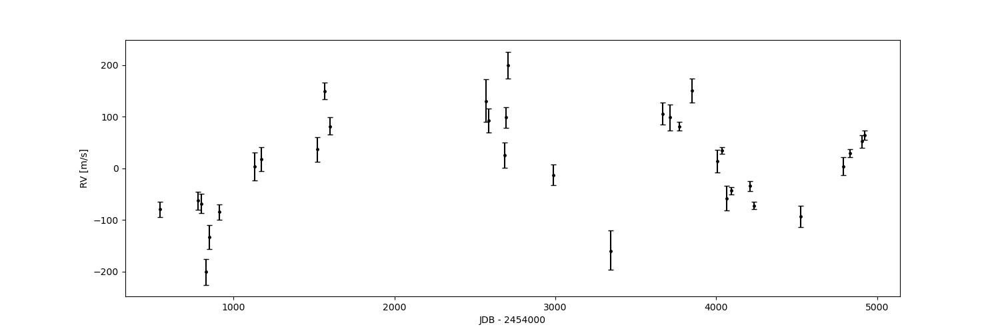

In [321]:
# periods = np.arange(0.01,100,0.0001)
# freqs = 1/periods
# plt.figure(figsize=(15,3))
# plt.semilogx(1/periods,flux_power,c='k')

# plt.xlabel("Frequency")
# plt.ylabel("Normalized power")
# plt.savefig(par_dir + "/plots/Periodo_TESS.png",bbox_inches='tight')
# plt.show()

# plt.figure(figsize=(15,3))
# plt.semilogx(1/periods,residus_power,c='k')
# plt.xlabel("Frequency [d$^{-1}$]")
# plt.ylabel("Normalized power")
# plt.savefig(par_dir + "/plots/Periodo_residus_TESS.png",bbox_inches='tight')
# plt.show()

# periods = np.arange(1,20000,0.01)
# freqs = 1/periods
# p_b = 3.0*365.25
# p_c = 22.9*365.25

# plt.figure(figsize=(5,3))
# plt.scatter(rv_time,rv_full,s=1,c='k')
# plt.xlabel("JDB - 2454000")
# plt.ylabel("RV [m/s]")
# plt.savefig(par_dir + "/plots/RV_TESS_ALL_norm.png",bbox_inches='tight')
# plt.show()

# plt.figure(figsize=(5,3))
# plt.scatter(rv_residus_time,rv_residus,s=1,c='k')

# plt.xlabel("JDB - 2454000")
# plt.ylabel("RV [m/s]")
# plt.savefig(par_dir + "/plots/residus_RV_TESS_ALL_norm.png",bbox_inches='tight')
# plt.show()

plt.figure(figsize=(15,5))
plt.errorbar(rv_offsets_time,rv_offsets,rv_offsets_error,markersize=5,capsize=3,c='k',fmt='.')

plt.xlabel("JDB - 2454000")
plt.ylabel("RV [m/s]")
plt.savefig(par_dir + "/plots/offsets_RV_TESS_ALL_norm.png",bbox_inches='tight')
plt.show()

# plt.figure(figsize=(5,3))
# plt.semilogx(periods,rv_power,c='k')
# plt.axvline(p_c,c='b',ls='--')
# plt.axvline(p_b,c="r",ls='--')
# plt.xlabel("Period [d])")
# plt.ylabel("Normalized power")
# plt.savefig(par_dir + "/plots/Periodo_RV_TESS_ALL_norm.png",bbox_inches='tight')
# plt.show()

# plt.figure(figsize=(5,3))
# plt.semilogx(periods,rv_residus_power,c='k')
# plt.axvline(p_c,c='b',ls='--')
# plt.axvline(p_b,c="r",ls='--')
# plt.xlabel("Period [d])")
# plt.ylabel("Normalized power")
# plt.savefig(par_dir + "/plots/Periodo_Residus_TESS_ALL_norm.png",bbox_inches='tight')
# plt.show()



<IPython.core.display.Javascript object>


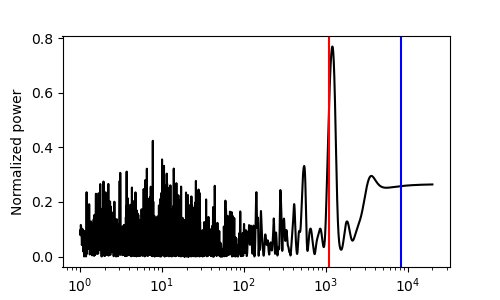

In [297]:
plt.figure(figsize=(5,3))
plt.semilogx(periods,rv_offsets_power,c='k')
plt.xlabel("Period [d])")
plt.ylabel("Normalized power")
plt.axvline(p_c,c='b',ls='--')
plt.axvline(p_b,c="r",ls='--')
plt.savefig(par_dir + "/plots/Periodo_Offsets_TESS_ALL_norm.png",bbox_inches='tight')
plt.show()

In [306]:
#plots exoplanets
# imaging_data = np.genfromtxt(par_dir+"/data/imaging_detection.dat",usecols=(4,9))
# plt.figure()
# plt.scatter(imaging_data[:,1],imaging_data[:,0],s=1)
# plt.show()
# imaging_data[:,0],imaging_data[:,1]
imaging_data = pd.read_csv(par_dir+"/data/imaging_detection.dat")

ParserError: Error tokenizing data. C error: Expected 2 fields in line 4, saw 8
